In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-290.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-3320.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-5824.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-9791.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-4015.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-9329.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-3488.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-8198.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-686.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-2678.png
/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/val/Normal/Normal-2001.png
/kaggle/input/datasets/

In [3]:
!pip install timm torch torchvision scikit-learn seaborn matplotlib
!pip install captum lime shap
import os
import torch
import timm
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import cv2
import timm
import torch
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import transforms

import shap
from lime import lime_image

from skimage.segmentation import mark_boundaries

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Using Device:", device)

Using Device: cuda


In [5]:
dataset_path = "/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset"

train_dir = os.path.join(dataset_path, "train")
val_dir = os.path.join(dataset_path, "val")
test_dir = os.path.join(dataset_path, "test")

In [6]:
import os

model_dir = "/kaggle/input/models/cricketcoder/covid/pytorch/default/1"

print(os.listdir(model_dir))

['best_vit.pth']


In [7]:
model_path = "/kaggle/input/models/cricketcoder/covid/pytorch/default/1/best_model.pth"

model = timm.create_model(
    "vit_base_patch16_224",
    pretrained=False,
    num_classes=3
)

model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/models/cricketcoder/covid/pytorch/default/1/best_model.pth'

In [8]:
import os

model_dir = "/kaggle/input/models/cricketcoder/covid/pytorch/default/1"

for f in os.listdir(model_dir):
    if f.endswith(".pth") or f.endswith(".pt"):
        model_path = os.path.join(model_dir, f)
        break

print("Loading:", model_path)

model.load_state_dict(torch.load(model_path, map_location=device))

Loading: /kaggle/input/models/cricketcoder/covid/pytorch/default/1/best_vit.pth


<All keys matched successfully>

In [9]:
model.to(device)
model.eval()

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (norm): Identity()
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False

In [10]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

In [16]:
img_path = "/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/test/Normal/Normal-10163.png"

image = Image.open(img_path).convert("RGB")

input_tensor = transform(image)

input_tensor = input_tensor.unsqueeze(0).to(device)

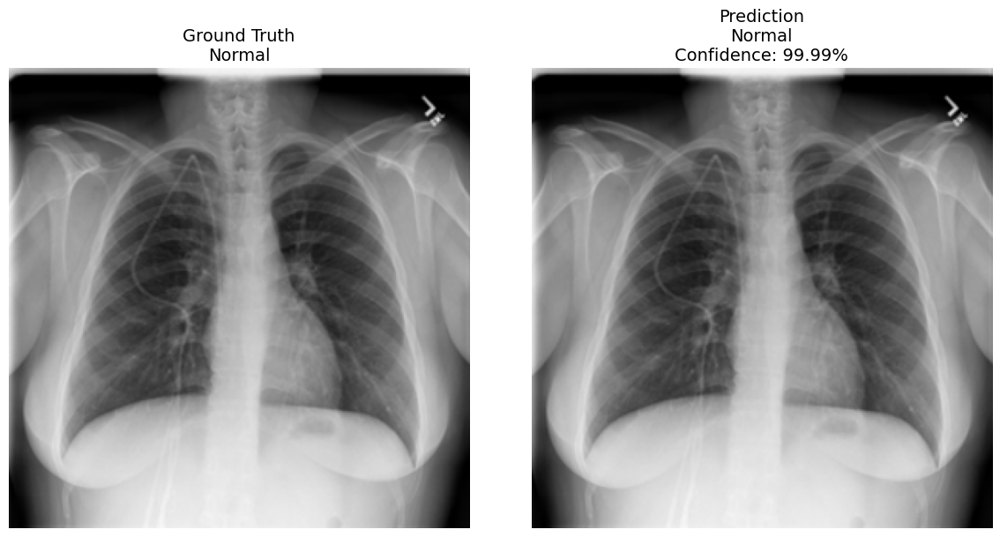

Ground Truth : Normal
Prediction   : Normal
Confidence   : 99.99%


In [17]:
import os
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np

# ==========================================
# Ground Truth
# ==========================================

ground_truth = os.path.basename(
    os.path.dirname(img_path)
)

# ==========================================
# Class Names
# ==========================================

class_names = [
    "COVID",
    "Normal",
    "Viral Pneumonia"
]

# ==========================================
# Prediction
# ==========================================

model.eval()

with torch.no_grad():

    outputs = model(input_tensor)

    probs = F.softmax(
        outputs,
        dim=1
    )

    confidence, pred_idx = torch.max(
        probs,
        dim=1
    )

pred_label = class_names[
    pred_idx.item()
]

confidence = confidence.item() * 100

# ==========================================
# Original Image
# ==========================================

img_np = np.array(image)

# ==========================================
# Visualization
# ==========================================

fig, ax = plt.subplots(
    1,
    2,
    figsize=(12,6)
)

# Ground Truth

ax[0].imshow(img_np)

ax[0].set_title(
    f"Ground Truth\n{ground_truth}",
    fontsize=14
)

ax[0].axis("off")

# Prediction

ax[1].imshow(img_np)

ax[1].set_title(
    f"Prediction\n{pred_label}\nConfidence: {confidence:.2f}%",
    fontsize=14
)

ax[1].axis("off")

plt.tight_layout()
plt.show()

# ==========================================
# Console Output
# ==========================================

print("="*50)
print(f"Ground Truth : {ground_truth}")
print(f"Prediction   : {pred_label}")
print(f"Confidence   : {confidence:.2f}%")
print("="*50)

**Grad-CAM**

In [12]:
!pip install grad-cam
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 58.6 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44286 sha256=c11389abe194378ac5c34dc55a022852f1211951becf1fc7aaaf605f1ce94fc0
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


In [13]:
def reshape_transform(tensor, height=14, width=14):
    """
    tensor shape:
    [B, 197, 768]

    Remove CLS token and reshape to:
    [B, C, 14, 14]
    """

    result = tensor[:, 1:, :]

    result = result.reshape(
        tensor.size(0),
        height,
        width,
        tensor.size(2)
    )

    result = result.transpose(2, 3)
    result = result.transpose(1, 2)

    return result

In [14]:
target_layers = [
    model.blocks[-4].norm1
]

In [15]:
rgb_img = np.array(image)

rgb_img = cv2.resize(
    rgb_img,
    (224,224)
)

rgb_img = rgb_img.astype(np.float32) / 255.0

In [16]:
classes = ['COVID', 'Normal', 'Viral Pneumonia']

with torch.no_grad():

    output = model(input_tensor)

    pred_class = output.argmax(
        dim=1
    ).item()

print(
    "Predicted:",
    classes[pred_class]
)

Predicted: Viral Pneumonia


In [17]:
cam = GradCAM(
    model=model,
    target_layers=target_layers,
    reshape_transform=reshape_transform
)
targets = [
    ClassifierOutputTarget(
        pred_class
    )
]

grayscale_cam = cam(
    input_tensor=input_tensor,
    targets=targets
)

grayscale_cam = grayscale_cam[0]
visualization = show_cam_on_image(
    rgb_img,
    grayscale_cam,
    use_rgb=True
)

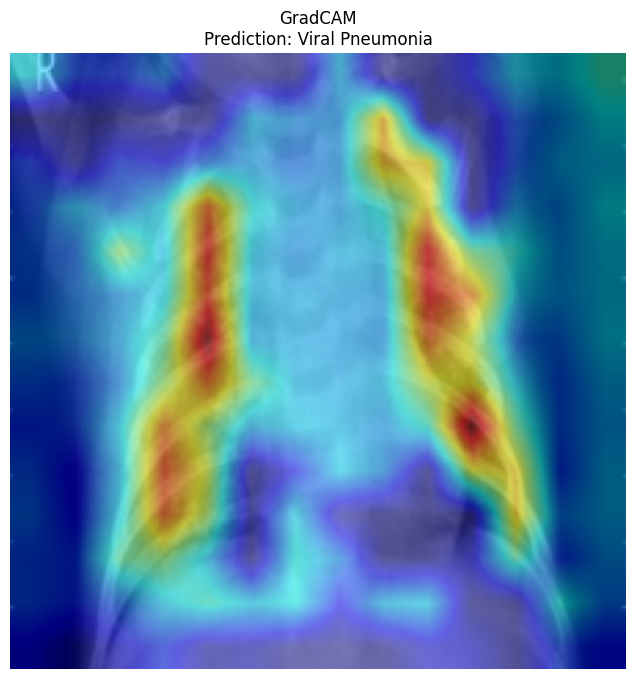

In [18]:
plt.figure(figsize=(8,8))

plt.imshow(
    visualization
)

plt.title(
    f"GradCAM\nPrediction: {classes[pred_class]}"
)

plt.axis("off")

plt.show()

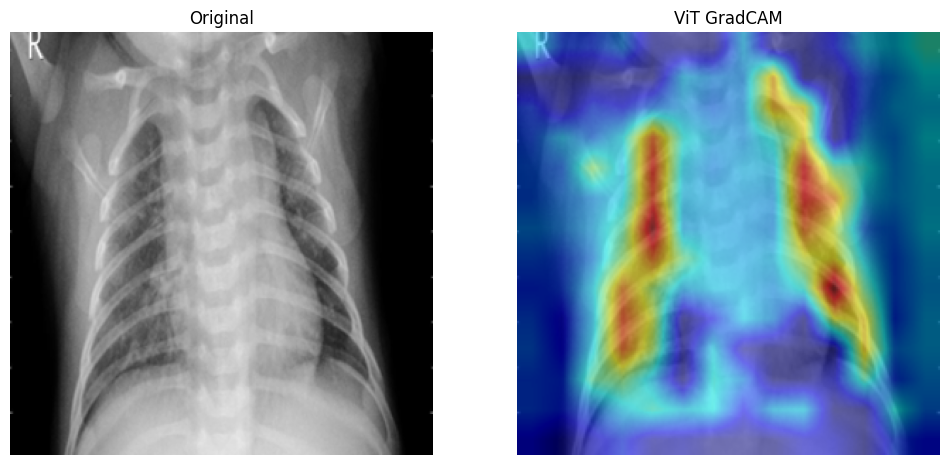

In [19]:
fig, ax = plt.subplots(
    1,
    2,
    figsize=(12,6)
)

ax[0].imshow(image)

ax[0].set_title("Original")

ax[0].axis("off")

ax[1].imshow(visualization)

ax[1].set_title("ViT GradCAM")

ax[1].axis("off")

plt.show()

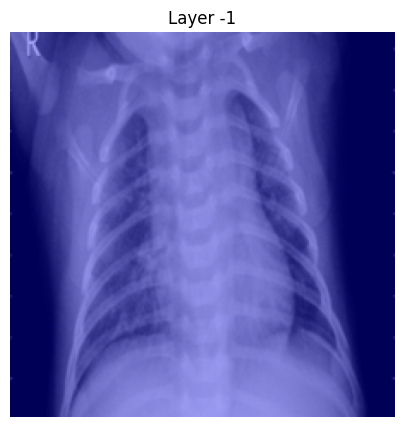

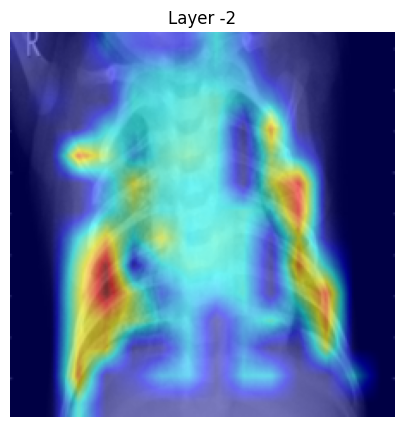

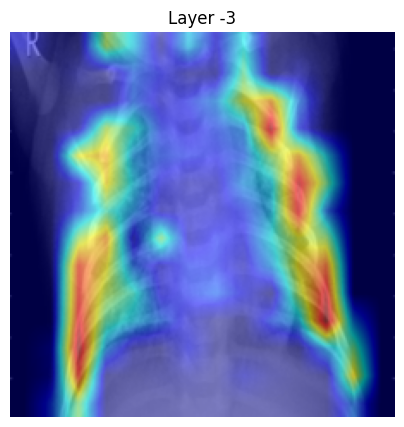

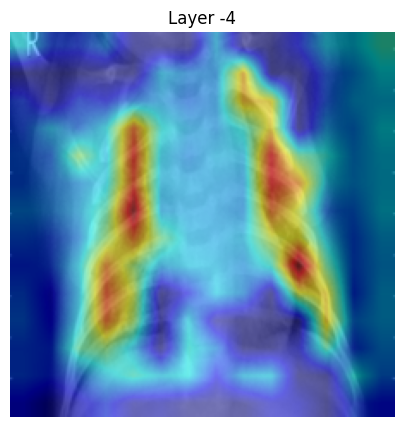

In [21]:
layers = [
    model.blocks[-1].norm1,
    model.blocks[-2].norm1,
    model.blocks[-3].norm1,
    model.blocks[-4].norm1
]

for idx, layer in enumerate(layers):

    cam = GradCAM(
        model=model,
        target_layers=[layer],
        reshape_transform=reshape_transform
    )

    grayscale_cam = cam(
        input_tensor=input_tensor,
        targets=[ClassifierOutputTarget(pred_class)]
    )[0]

    visualization = show_cam_on_image(
        rgb_img,
        grayscale_cam,
        use_rgb=True
    )

    plt.figure(figsize=(5,5))
    plt.imshow(visualization)
    plt.title(f"Layer {-idx-1}")
    plt.axis("off")
    plt.show()

Attribute Map ( Integrated Grad)

In [23]:
!pip install captum

In [24]:
from captum.attr import IntegratedGradients

import numpy as np
import matplotlib.pyplot as plt

In [26]:
ig = IntegratedGradients(model)

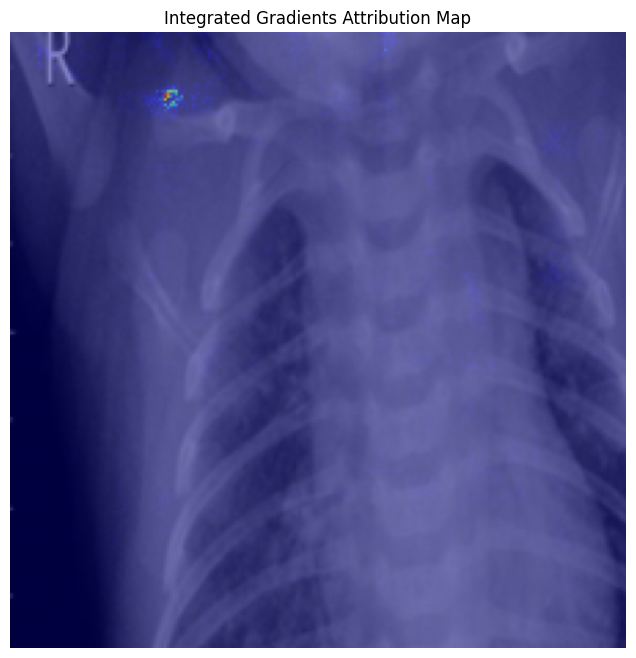

In [27]:
input_tensor.requires_grad = True

attributions = ig.attribute(
    input_tensor,
    target=pred_class,
    n_steps=50
)
attr_map = attributions.squeeze().cpu().detach().numpy()

attr_map = np.mean(
    np.abs(attr_map),
    axis=0
)

attr_map = (
    attr_map - attr_map.min()
) / (
    attr_map.max() - attr_map.min()
)
plt.figure(figsize=(8,8))

plt.imshow(image)

plt.imshow(
    attr_map,
    cmap='jet',
    alpha=0.5
)

plt.title(
    "Integrated Gradients Attribution Map"
)

plt.axis("off")

plt.show()

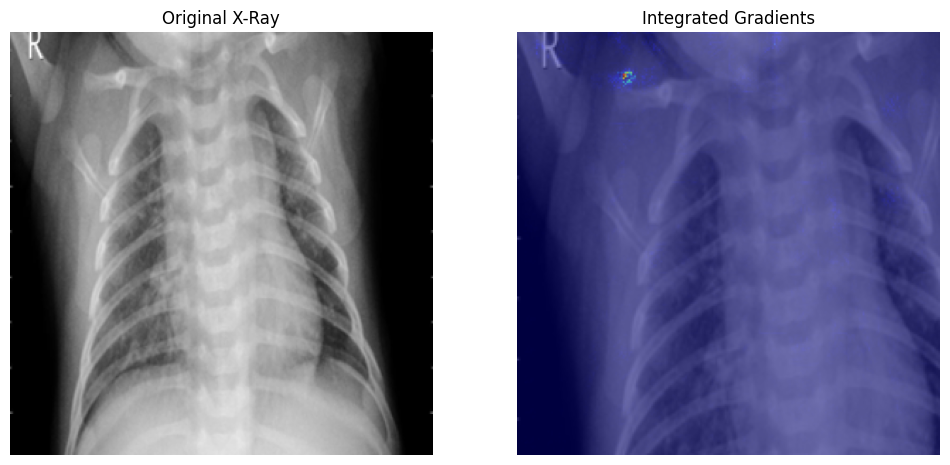

In [28]:
fig, ax = plt.subplots(
    1,
    2,
    figsize=(12,6)
)

ax[0].imshow(image)

ax[0].set_title(
    "Original X-Ray"
)

ax[0].axis("off")

ax[1].imshow(image)

ax[1].imshow(
    attr_map,
    cmap='jet',
    alpha=0.5
)

ax[1].set_title(
    "Integrated Gradients"
)

ax[1].axis("off")

plt.show()

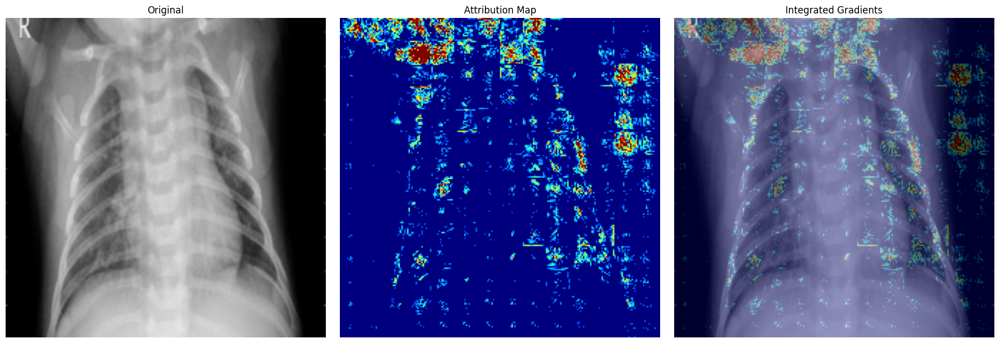

In [29]:
from captum.attr import IntegratedGradients
import numpy as np
import cv2
import matplotlib.pyplot as plt
import gc
import torch

# ==========================
# Clear GPU memory
# ==========================

gc.collect()
torch.cuda.empty_cache()

# ==========================
# Integrated Gradients
# ==========================

ig = IntegratedGradients(model)

attributions = ig.attribute(
    input_tensor,
    target=pred_class,
    n_steps=20
)

# ==========================
# Convert to Attribution Map
# ==========================

attr_map = attributions.squeeze().detach().cpu().numpy()

# Use max channel importance
attr_map = np.max(
    np.abs(attr_map),
    axis=0
)

# Robust normalization
p1 = np.percentile(attr_map, 5)
p99 = np.percentile(attr_map, 99)

attr_map = np.clip(
    attr_map,
    p1,
    p99
)

attr_map = (
    attr_map - attr_map.min()
) / (
    attr_map.max() - attr_map.min() + 1e-8
)

# Remove weak activations
attr_map[attr_map < 0.20] = 0

# ==========================
# Create Heatmap
# ==========================

heatmap = cv2.applyColorMap(
    np.uint8(255 * attr_map),
    cv2.COLORMAP_JET
)

heatmap = cv2.cvtColor(
    heatmap,
    cv2.COLOR_BGR2RGB
)

# Ensure the original image is also 224x224 and uint8 for blending and display
# rgb_img is already resized and normalized to [0,1] in BXyk8JsEepx5
original_for_display = (rgb_img * 255).astype(np.uint8)

overlay = cv2.addWeighted(
    original_for_display,
    0.65,
    heatmap,
    0.35,
    0
)

# ==========================
# Visualization
# ==========================

fig, ax = plt.subplots(
    1,
    3,
    figsize=(18,6)
)

ax[0].imshow(original_for_display)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(
    attr_map,
    cmap="jet"
)
ax[1].set_title("Attribution Map")
ax[1].axis("off")

ax[2].imshow(overlay)
ax[2].set_title("Integrated Gradients")
ax[2].axis("off")

plt.tight_layout()
plt.show()

LIME 

In [30]:
!pip install lime

In [31]:
from lime import lime_image

from skimage.segmentation import mark_boundaries

import numpy as np
import matplotlib.pyplot as plt
import torch

In [32]:
def batch_predict(images):

    model.eval()

    batch = []

    for img in images:

        img = Image.fromarray(
            img.astype(np.uint8)
        )

        img = transform(img)

        batch.append(img)

    batch = torch.stack(batch).to(device)

    with torch.no_grad():

        logits = model(batch)

        probs = torch.softmax(
            logits,
            dim=1
        )

    return probs.cpu().numpy()

In [33]:
lime_img = np.array(image)

print(lime_img.shape)
explainer = lime_image.LimeImageExplainer()

(299, 299, 3)


In [35]:
explanation = explainer.explain_instance(
    lime_img,
    batch_predict,
    top_labels=3,
    hide_color=0,
    num_samples=500
)

  0%|          | 0/500 [00:00<?, ?it/s]

In [36]:
temp, mask = explanation.get_image_and_mask(
    pred_class,
    positive_only=True,
    num_features=5,
    hide_rest=False
)

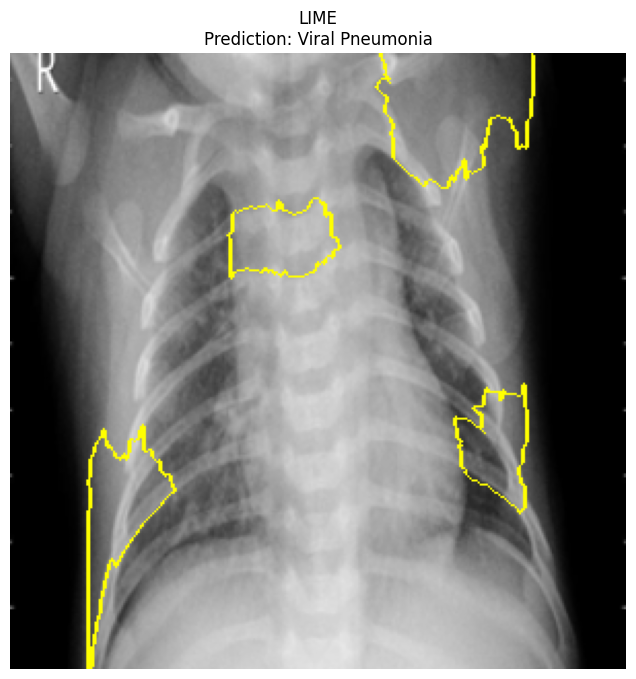

In [37]:
plt.figure(figsize=(8,8))

plt.imshow(
    mark_boundaries(
        temp/255.0,
        mask
    )
)

plt.title(
    f"LIME\nPrediction: {classes[pred_class]}"
)

plt.axis("off")

plt.show()

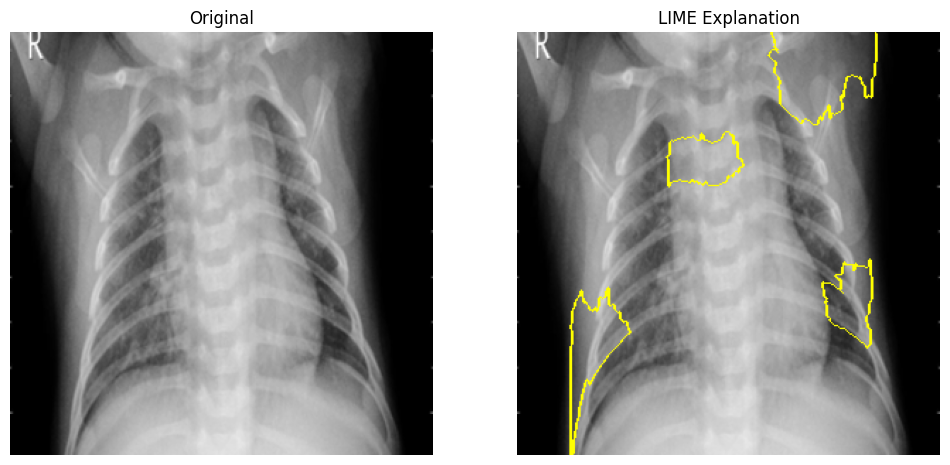

In [38]:
fig, ax = plt.subplots(
    1,
    2,
    figsize=(12,6)
)

ax[0].imshow(lime_img)

ax[0].set_title(
    "Original"
)

ax[0].axis("off")

ax[1].imshow(
    mark_boundaries(
        temp/255.0,
        mask
    )
)

ax[1].set_title(
    "LIME Explanation"
)

ax[1].axis("off")

plt.show()

SHAP

In [39]:
import shap
import torch
import numpy as np
import matplotlib.pyplot as plt

# Create a zero tensor with the same shape as input_tensor for background
background = torch.zeros_like(input_tensor).to(device)

explainer = shap.GradientExplainer(
    model,
    background
)
shap_values = explainer.shap_values(
    input_tensor
)
print(type(shap_values))

if isinstance(shap_values, list):
    print(len(shap_values))
    print(shap_values[0].shape)
else:
    print(shap_values.shape)

<class 'numpy.ndarray'>
(1, 3, 224, 224, 3)


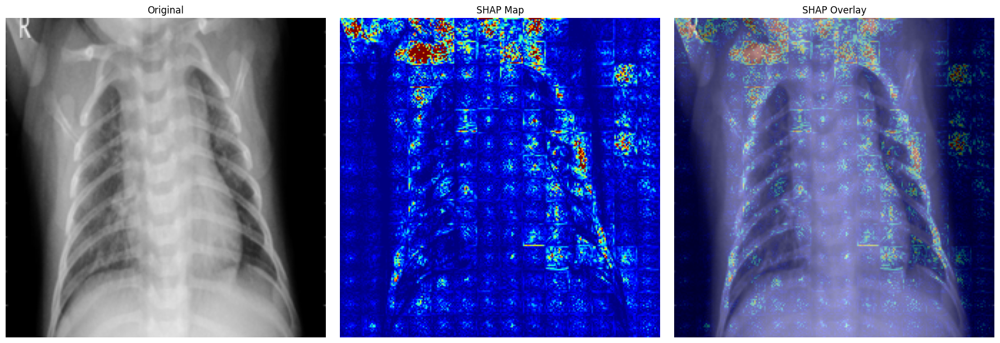

In [40]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# SHAP map for predicted class

shap_map = shap_values[0, pred_class]

# Aggregate RGB channels

shap_map = np.mean(
    np.abs(shap_map),
    axis=-1
)

# Normalize

shap_map = (
    shap_map - shap_map.min()
) / (
    shap_map.max() - shap_map.min() + 1e-8
)

# Percentile clipping

p1 = np.percentile(shap_map, 5)
p99 = np.percentile(shap_map, 99)

shap_map = np.clip(
    shap_map,
    p1,
    p99
)

shap_map = (
    shap_map - shap_map.min()
) / (
    shap_map.max() - shap_map.min() + 1e-8
)

# Heatmap

heatmap = cv2.applyColorMap(
    np.uint8(255 * shap_map),
    cv2.COLORMAP_JET
)

heatmap = cv2.cvtColor(
    heatmap,
    cv2.COLOR_BGR2RGB
)

# Original image

original = (rgb_img * 255).astype(np.uint8)

overlay = cv2.addWeighted(
    original,
    0.65,
    heatmap,
    0.35,
    0
)

# Plot

fig, ax = plt.subplots(
    1,
    3,
    figsize=(18,6)
)

ax[0].imshow(original)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(
    shap_map,
    cmap="jet"
)
ax[1].set_title("SHAP Map")
ax[1].axis("off")

ax[2].imshow(overlay)
ax[2].set_title("SHAP Overlay")
ax[2].axis("off")

plt.tight_layout()
plt.show()

Raw SHAP Shape: (224, 224, 3)
Min: -0.38968304502087475
Max: 0.3666107909318749
Mean: 7.585287001620163e-06
95th Percentile: 0.010194580961070364


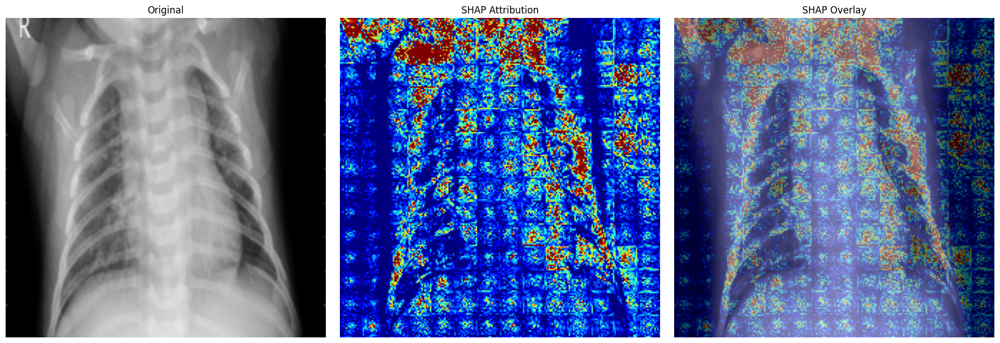

In [41]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ==========================
# Extract SHAP for predicted class
# ==========================

# shap_values from GradientExplainer for a multi-output model and batch_size=1
# is typically an ndarray of shape (1, num_classes, H, W, C)
# To get the SHAP map for the predicted class (pred_class) for the first image in the batch:
shap_map = shap_values[0, pred_class]

print("Raw SHAP Shape:", shap_map.shape)
print("Min:", shap_map.min())
print("Max:", shap_map.max())
print("Mean:", shap_map.mean())

# ==========================
# Aggregate channels
# ==========================

shap_map = np.sum(
    np.abs(shap_map),
    axis=-1
)

# ==========================
# Robust normalization
# ==========================

eps = 1e-10

p95 = np.percentile(shap_map, 95)

print("95th Percentile:", p95)

shap_map = shap_map / (p95 + eps)

shap_map = np.clip(
    shap_map,
    0,
    1
)

# ==========================
# Optional threshold
# ==========================

shap_map[shap_map < 0.10] = 0

# ==========================
# Heatmap
# ==========================

heatmap = cv2.applyColorMap(
    np.uint8(255 * shap_map),
    cv2.COLORMAP_JET
)

heatmap = cv2.cvtColor(
    heatmap,
    cv2.COLOR_BGR2RGB
)

# ==========================
# Original Image
# ==========================

original = (rgb_img * 255).astype(np.uint8)

overlay = cv2.addWeighted(
    original,
    0.6,
    heatmap,
    0.4,
    0
)

# ==========================
# Visualization
# ==========================

fig, ax = plt.subplots(
    1,
    3,
    figsize=(18,6)
)

ax[0].imshow(original)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(
    shap_map,
    cmap="jet"
)
ax[1].set_title("SHAP Attribution")
ax[1].axis("off")

ax[2].imshow(overlay)
ax[2].set_title("SHAP Overlay")
ax[2].axis("off")

plt.tight_layout()
plt.show()

Attention Rollout


In [42]:
print(model.blocks[-1].attn.fused_attn)

True


In [44]:
for block in model.blocks:
    block.attn.fused_attn = False
    

In [46]:
import torch
import numpy as np
import cv2

class AttentionRollout:

    def __init__(self, model):

        self.model = model
        self.attentions = []

        for block in model.blocks:
            block.attn.register_forward_hook(
                self.get_attention
            )

    def get_attention(
        self,
        module,
        input,
        output
    ):
        if hasattr(module, "attn_map"):
            self.attentions.append(
                module.attn_map.detach().cpu()
            )

    def rollout(self):

        result = torch.eye(
            self.attentions[0].shape[-1]
        )

        for attn in self.attentions:

            attn = attn.mean(dim=1)

            attn = attn + torch.eye(
                attn.shape[-1]
            )

            attn = attn / attn.sum(
                dim=-1,
                keepdim=True
            )

            result = attn @ result

        mask = result[0,0,1:]

        mask = mask.reshape(
            14,
            14
        )

        mask = mask.numpy()

        mask = cv2.resize(
            mask,
            (224,224)
        )

        mask = (
            mask -
            mask.min()
        ) / (
            mask.max() -
            mask.min() +
            1e-8
        )

        return mask

In [47]:
def my_forward(self, x, attn_mask=None, is_causal=False):

    B, N, C = x.shape

    qkv = self.qkv(x)

    qkv = qkv.reshape(
        B,
        N,
        3,
        self.num_heads,
        C // self.num_heads
    )

    qkv = qkv.permute(
        2,
        0,
        3,
        1,
        4
    )

    q, k, v = qkv[0], qkv[1], qkv[2]

    attn = (
        q @ k.transpose(-2,-1)
    ) * self.scale

    attn = attn.softmax(dim=-1)

    self.attn_map = attn

    attn = self.attn_drop(attn)

    x = (attn @ v)

    x = x.transpose(
        1,
        2
    ).reshape(
        B,
        N,
        C
    )

    x = self.proj(x)

    x = self.proj_drop(x)

    return x

In [49]:
from types import MethodType

for block in model.blocks:

    block.attn.forward = MethodType(
        my_forward,
        block.attn
    )

Captured Layers: 12


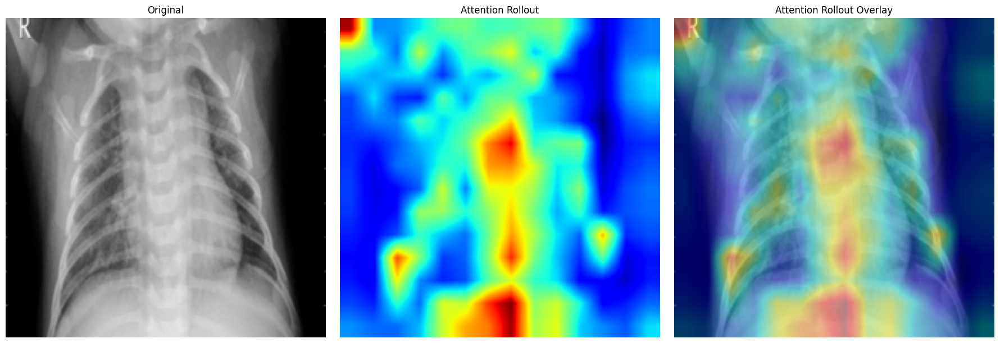

Rollout Shape: (224, 224)
Min: 0.0
Max: 0.99999803


In [50]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from types import MethodType

# =====================================================
# Disable fused attention
# =====================================================

for block in model.blocks:
    if hasattr(block.attn, "fused_attn"):
        block.attn.fused_attn = False

# =====================================================
# Universal Attention Patch
# =====================================================

def my_forward(self, x, *args, **kwargs):

    attn_mask = kwargs.get("attn_mask", None)

    B, N, C = x.shape

    qkv = self.qkv(x)

    qkv = qkv.reshape(
        B,
        N,
        3,
        self.num_heads,
        C // self.num_heads
    )

    qkv = qkv.permute(
        2,
        0,
        3,
        1,
        4
    )

    q, k, v = qkv.unbind(0)

    attn = (
        q @ k.transpose(-2, -1)
    ) * self.scale

    if attn_mask is not None:
        attn = attn + attn_mask

    attn = attn.softmax(dim=-1)

    # Save attention
    self.attn_map = attn.detach()

    attn = self.attn_drop(attn)

    x = attn @ v

    x = x.transpose(
        1,
        2
    ).reshape(
        B,
        N,
        C
    )

    x = self.proj(x)

    x = self.proj_drop(x)

    return x

# =====================================================
# Patch Every Transformer Block
# =====================================================

for block in model.blocks:
    block.attn.forward = MethodType(
        my_forward,
        block.attn
    )

# =====================================================
# Attention Rollout Collector
# =====================================================

class AttentionRollout:

    def __init__(self, model):

        self.attentions = []

        for block in model.blocks:

            block.attn.register_forward_hook(
                self.save_attention
            )

    def save_attention(
        self,
        module,
        inp,
        output
    ):

        if hasattr(module, "attn_map"):

            self.attentions.append(
                module.attn_map.cpu()
            )

    def compute(self):

        result = torch.eye(
            self.attentions[0].shape[-1]
        )

        for attn in self.attentions:

            attn = attn.mean(dim=1)

            identity = torch.eye(
                attn.shape[-1]
            )

            attn = attn + identity

            attn = attn / attn.sum(
                dim=-1,
                keepdim=True
            )

            result = attn @ result

        mask = result[0, 0, 1:]

        mask = mask.reshape(
            14,
            14
        )

        mask = mask.numpy()

        mask = cv2.resize(
            mask,
            (224,224)
        )

        mask = (
            mask -
            mask.min()
        ) / (
            mask.max() -
            mask.min() +
            1e-8
        )

        return mask

# =====================================================
# Generate Rollout
# =====================================================

rollout = AttentionRollout(model)

with torch.no_grad():

    pred = model(input_tensor)

print(
    "Captured Layers:",
    len(rollout.attentions)
)

rollout_map = rollout.compute()

# =====================================================
# Visualization
# =====================================================

original = (
    rgb_img * 255
).astype(np.uint8)

heatmap = cv2.applyColorMap(
    np.uint8(
        rollout_map * 255
    ),
    cv2.COLORMAP_JET
)

heatmap = cv2.cvtColor(
    heatmap,
    cv2.COLOR_BGR2RGB
)

overlay = cv2.addWeighted(
    original,
    0.6,
    heatmap,
    0.4,
    0
)

fig, ax = plt.subplots(
    1,
    3,
    figsize=(18,6)
)

ax[0].imshow(original)
ax[0].set_title("Original")
ax[0].axis("off")

ax[1].imshow(
    rollout_map,
    cmap="jet"
)
ax[1].set_title(
    "Attention Rollout"
)
ax[1].axis("off")

ax[2].imshow(overlay)
ax[2].set_title(
    "Attention Rollout Overlay"
)
ax[2].axis("off")

plt.tight_layout()
plt.show()

print("Rollout Shape:", rollout_map.shape)
print("Min:", rollout_map.min())
print("Max:", rollout_map.max())

In [52]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

# ============================================
# Improved Rollout Computation
# ============================================

def compute_improved_rollout(attentions,
                             discard_ratio=0.3):

    result = torch.eye(
        attentions[0].shape[-1]
    )

    for attn in attentions:

        # Average heads
        attn = attn.mean(dim=1)

        # --------------------------------
        # Discard weakest attention links
        # --------------------------------

        flat = attn.view(
            attn.size(0),
            -1
        )

        _, indices = flat.topk(
            int(
                flat.size(-1)
                * discard_ratio
            ),
            dim=-1,
            largest=False
        )

        flat[0, indices[0]] = 0

        attn = flat.view(
            attn.shape
        )

        # Residual connection

        identity = torch.eye(
            attn.shape[-1]
        )

        attn = attn + identity

        attn = attn / attn.sum(
            dim=-1,
            keepdim=True
        )

        result = attn @ result

    # ==================================
    # Patch token rollout
    # ==================================

    mask = result[0,1:,1:]

    mask = mask.mean(
        dim=0
    )

    mask = mask.reshape(
        14,
        14
    )

    mask = mask.numpy()

    # ==================================
    # Resize
    # ==================================

    mask = cv2.resize(
        mask,
        (224,224)
    )

    # ==================================
    # Smooth
    # ==================================

    mask = cv2.GaussianBlur(
        mask,
        (15,15),
        0
    )

    # ==================================
    # Robust normalization
    # ==================================

    p99 = np.percentile(
        mask,
        99
    )

    mask = np.clip(
        mask,
        0,
        p99
    )

    mask = (
        mask - mask.min()
    ) / (
        mask.max()
        - mask.min()
        + 1e-8
    )

    return mask

# ============================================
# Function to plot attention rollout
# ============================================

def plot_attention_rollout(image_path, model, transform, device, classes, discard_ratio=0.3):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    rgb_img = np.array(image)
    rgb_img = cv2.resize(rgb_img, (224, 224))
    rgb_img = rgb_img.astype(np.float32) / 255.0

    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax(dim=1).item()

    rollout = AttentionRollout(model)
    with torch.no_grad():
        model(input_tensor) # Re-run model to capture attentions

    rollout_map = compute_improved_rollout(
        rollout.attentions,
        discard_ratio=discard_ratio
    )

    original = (
        rgb_img * 255
    ).astype(np.uint8)

    heatmap = cv2.applyColorMap(
        np.uint8(
            rollout_map * 255
        ),
        cv2.COLORMAP_JET
    )

    heatmap = cv2.cvtColor(
        heatmap,
        cv2.COLOR_BGR2RGB
    )

    overlay = cv2.addWeighted(
        original,
        0.65,
        heatmap,
        0.35,
        0
    )

    fig, ax = plt.subplots(
        1,
        3,
        figsize=(18,6)
    )

    ax[0].imshow(original)
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(
        rollout_map,
        cmap="jet"
    )
    ax[1].set_title(
        f"Attention Rollout\nPredicted: {classes[pred_class]}"
    )
    ax[1].axis("off")

    ax[2].imshow(overlay)
    ax[2].set_title(
        "Attention Rollout Overlay"
    )
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

    print(
        "Min:",
        rollout_map.min()
    )

    print(
        "Max:",
        rollout_map.max()
    )

# Previous visualization code (now part of the function, removed from global scope)
# This section of the code was removed as it is now handled by the function above.
# ============================================
# Generate Improved Rollout - REMOVED
# ============================================
# rollout_map = compute_improved_rollout(
#     rollout.attentions,
#     discard_ratio=0.3
# )

# ============================================
# Overlay - REMOVED
# ============================================
# original = (
#     rgb_img * 255
# ).astype(np.uint8)

# heatmap = cv2.applyColorMap(
#     np.uint8(
#         rollout_map * 255
#     ),
#     cv2.COLORMAP_JET
# )

# heatmap = cv2.cvtColor(
#     heatmap,
#     cv2.COLOR_BGR2RGB
# )

# overlay = cv2.addWeighted(
#     original,
#     0.65,
#     heatmap,
#     0.35,
#     0
# )

# ============================================
# Visualization - REMOVED
# ============================================
# fig, ax = plt.subplots(
#     1,
#     3,
#     figsize=(18,6)
# )

# ax[0].imshow(original)
# ax[0].set_title("Original")
# ax[0].axis("off")

# ax[1].imshow(
#     rollout_map,
#     cmap="jet"
# )
# ax[1].set_title(
#     "Improved Attention Rollout"
# )
# ax[1].axis("off")

# ax[2].imshow(overlay)
# ax[2].set_title(
#     "Attention Rollout Overlay"
# )
# ax[2].axis("off")

# plt.tight_layout()
# plt.show()

# print(
#     "Min:",
#     rollout_map.min()
# )

# print(
#     "Max:",
#     rollout_map.max()
# )

Processing COVID image:


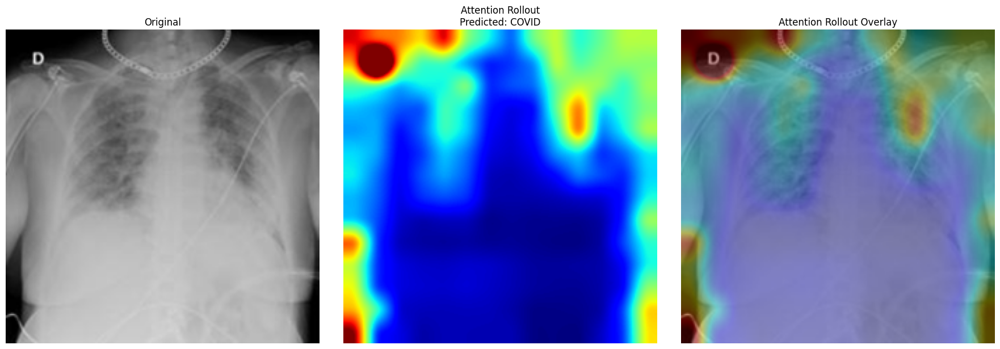

Min: 0.0
Max: 0.9999988
Processing Normal image:


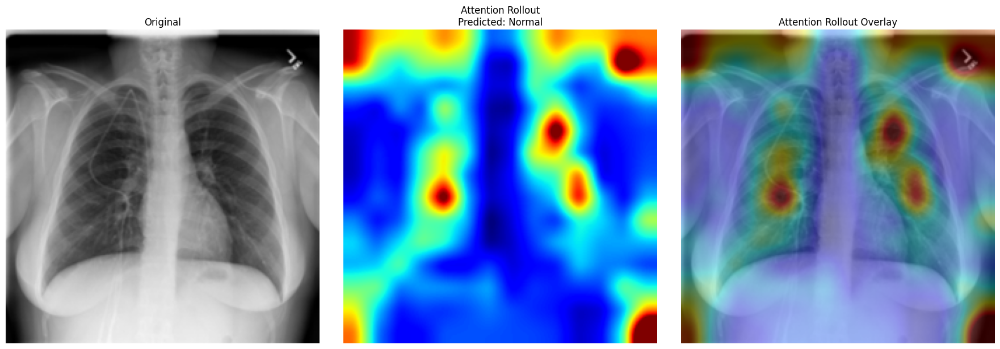

Min: 0.0
Max: 0.9999983
Processing Viral Pneumonia image:


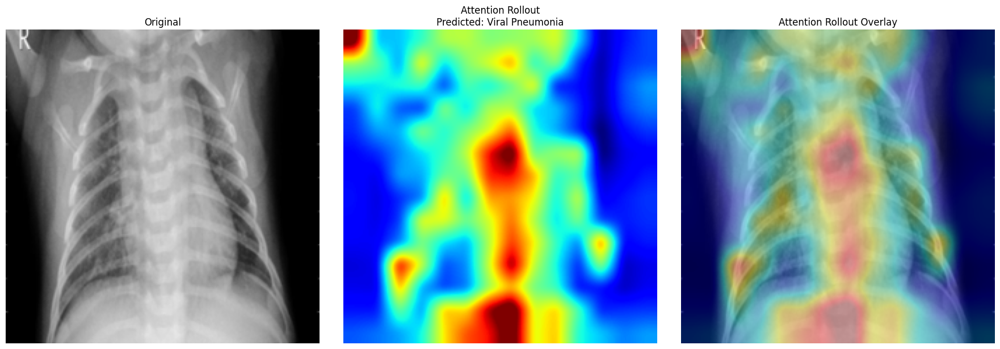

Min: 0.0
Max: 0.99999785


In [53]:
# Get image paths for different classes from the test set
covid_image_path ="/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/test/COVID/COVID-1010.png"
normal_image_path = "/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/test/Normal/Normal-10163.png"
viral_pneumonia_image_path = "/kaggle/input/datasets/cricketcoder/covid-19/COVID_19_dataset/test/Viral Pneumonia/Viral Pneumonia-1019.png"

print("Processing COVID image:")
plot_attention_rollout(covid_image_path, model, transform, device, classes)

print("Processing Normal image:")
plot_attention_rollout(normal_image_path, model, transform, device, classes)

print("Processing Viral Pneumonia image:")
plot_attention_rollout(viral_pneumonia_image_path, model, transform, device, classes)


In [54]:
def plot_attention_rollout_tuned_blur(image_path, model, transform, device, classes, discard_ratio=0.3, kernel_size=(15, 15), sigma=0):
    image = Image.open(image_path).convert("RGB")
    input_tensor = transform(image).unsqueeze(0).to(device)

    rgb_img = np.array(image)
    rgb_img = cv2.resize(rgb_img, (224, 224))
    rgb_img = rgb_img.astype(np.float32) / 255.0

    with torch.no_grad():
        output = model(input_tensor)
        pred_class = output.argmax(dim=1).item()

    rollout = AttentionRollout(model)
    with torch.no_grad():
        model(input_tensor) # Re-run model to capture attentions

    # ============================================
    # Improved Rollout Computation with Tuned Blur
    # ============================================

    attentions = rollout.attentions
    result = torch.eye(attentions[0].shape[-1])

    for attn in attentions:
        attn = attn.mean(dim=1)

        flat = attn.view(attn.size(0), -1)
        _, indices = flat.topk(int(flat.size(-1) * discard_ratio), dim=-1, largest=False)
        flat[0, indices[0]] = 0
        attn = flat.view(attn.shape)

        identity = torch.eye(attn.shape[-1])
        attn = attn + identity
        attn = attn / attn.sum(dim=-1, keepdim=True)
        result = attn @ result

    mask = result[0,1:,1:]
    mask = mask.mean(dim=0)
    mask = mask.reshape(14, 14)
    mask = mask.numpy()

    mask = cv2.resize(mask, (224,224))

    # Apply Gaussian Blur with custom parameters
    mask = cv2.GaussianBlur(mask, kernel_size, sigma)

    p99 = np.percentile(mask, 99)
    mask = np.clip(mask, 0, p99)
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)

    rollout_map = mask

    original = (
        rgb_img * 255
    ).astype(np.uint8)

    heatmap = cv2.applyColorMap(
        np.uint8(
            rollout_map * 255
        ),
        cv2.COLORMAP_JET
    )

    heatmap = cv2.cvtColor(
        heatmap,
        cv2.COLOR_BGR2RGB
    )

    overlay = cv2.addWeighted(
        original,
        0.65,
        heatmap,
        0.35,
        0
    )

    fig, ax = plt.subplots(
        1,
        3,
        figsize=(18,6)
    )

    ax[0].imshow(original)
    ax[0].set_title("Original")
    ax[0].axis("off")

    ax[1].imshow(
        rollout_map,
        cmap="jet"
    )
    ax[1].set_title(
        f"Attention Rollout\nPredicted: {classes[pred_class]}\nKernel: {kernel_size}, Sigma: {sigma}"
    )
    ax[1].axis("off")

    ax[2].imshow(overlay)
    ax[2].set_title(
        "Attention Rollout Overlay"
    )
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()

    print(
        "Min:",
        rollout_map.min()
    )

    print(
        "Max:",
        rollout_map.max()
    )


Processing COVID image with tuned blur:


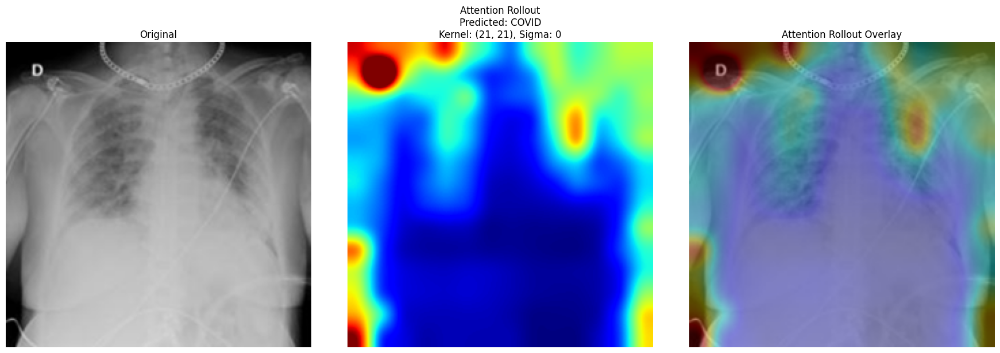

Min: 0.0
Max: 0.99999875


In [55]:
# Example usage with custom blur parameters
print("Processing COVID image with tuned blur:")
plot_attention_rollout_tuned_blur(
covid_image_path, model, transform, device, classes,
    kernel_size=(21, 21), # Example: Larger kernel size
    sigma=0              # Example: Default sigma, or try a value like 5
)


Original Attention Rollout (default blur):


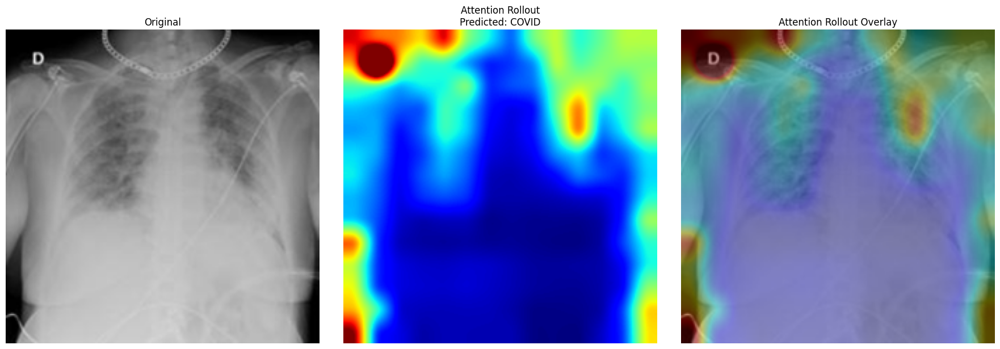

Min: 0.0
Max: 0.9999988

Tuned Blur Attention Rollout (kernel_size=(21, 21), sigma=0):


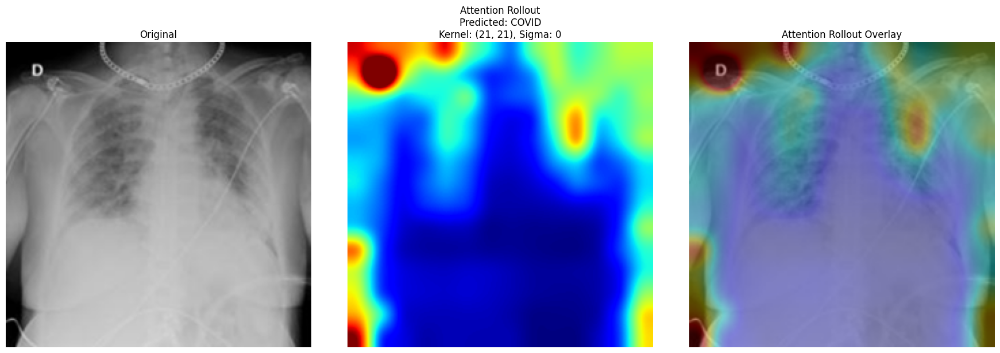

Min: 0.0
Max: 0.99999875


In [56]:
print("Original Attention Rollout (default blur):")
plot_attention_rollout(covid_image_path, model, transform, device, classes)

print("\nTuned Blur Attention Rollout (kernel_size=(21, 21), sigma=0):")
plot_attention_rollout_tuned_blur(
covid_image_path, model, transform, device, classes,
    kernel_size=(21, 21),
    sigma=0
)


In [57]:
import torch
import numpy as np
import pandas as pd
import cv2
import gc

from scipy.stats import entropy
def get_confidence(img_tensor):

    with torch.no_grad():

        logits = model(
            img_tensor.to(device)
        )

        probs = torch.softmax(
            logits,
            dim=1
        )

    return probs[
        0,
        pred_class
    ].item()

In [58]:
def compute_entropy(
    saliency
):

    saliency = saliency.astype(
        np.float32
    )

    saliency = (
        saliency
        -
        saliency.min()
    ) / (
        saliency.max()
        -
        saliency.min()
        +
        1e-8
    )

    saliency = saliency.flatten()

    saliency += 1e-10

    saliency = (
        saliency
        /
        saliency.sum()
    )

    return entropy(
        saliency
    )

In [59]:
def insertion_metric(
    saliency,
    input_tensor,
    steps=10
):

    saliency = cv2.resize(
        saliency,
        (224,224)
    )

    saliency = (
        saliency
        -
        saliency.min()
    ) / (
        saliency.max()
        -
        saliency.min()
        +
        1e-8
    )

    saliency = saliency.flatten()

    order = np.argsort(
        saliency
    )[::-1].copy()

    original = input_tensor.clone()

    baseline = torch.zeros_like(
        original
    )

    pixels_per_step = (
        len(order)
        //
        steps
    )

    scores = []

    for i in range(steps):

        temp = baseline.clone()

        idx = order[
            : (i+1)
            * pixels_per_step
        ]

        for c in range(3):

            temp[0,c].view(-1)[idx] = \
            original[0,c].view(-1)[idx]

        score = get_confidence(
            temp
        )

        scores.append(
            score
        )

    return np.mean(
        scores
    )

In [62]:
def deletion_metric(
    saliency,
    input_tensor,
    steps=10
):

    saliency = cv2.resize(
        saliency,
        (224,224)
    )

    saliency = (
        saliency
        -
        saliency.min()
    ) / (
        saliency.max()
        -
        saliency.min()
        +
        1e-8
    )

    saliency = saliency.flatten()

    order = np.argsort(
        saliency
    )[::-1].copy()

    original = input_tensor.clone()

    pixels_per_step = (
        len(order)
        //
        steps
    )

    scores = []

    for i in range(steps):

        temp = original.clone()

        idx = order[
            : (i+1)
            * pixels_per_step
        ]

        for c in range(3):

            temp[0,c].view(-1)[idx] = 0

        score = get_confidence(
            temp
        )

        scores.append(
            score
        )

    return np.mean(
        scores
    )

In [64]:
def compute_aopc(
    saliency,
    input_tensor,
    steps=10
):

    saliency = cv2.resize(
        saliency,
        (224,224)
    )

    saliency = (
        saliency
        -
        saliency.min()
    ) / (
        saliency.max()
        -
        saliency.min()
        +
        1e-8
    )

    saliency = saliency.flatten()

    order = np.argsort(
        saliency
    )[::-1].copy()

    original_score = get_confidence(
        input_tensor
    )

    pixels_per_step = (
        len(order)
        //
        steps
    )

    drops = []

    for i in range(steps):

        temp = input_tensor.clone()

        idx = order[
            : (i+1)
            * pixels_per_step
        ]

        for c in range(3):

            temp[0,c].view(-1)[idx] = 0

        score = get_confidence(
            temp
        )

        drops.append(
            original_score
            -
            score
        )

    return np.mean(
        drops
    )

In [65]:
lime_metric_map = mask.astype(
    np.float32
)

lime_metric_map = (
    lime_metric_map
    -
    lime_metric_map.min()
) / (
    lime_metric_map.max()
    -
    lime_metric_map.min()
    +
    1e-8
)

maps = {

    "GradCAM":
        grayscale_cam,

    "IntegratedGradients":
        attr_map,

    "LIME":
        lime_metric_map,

    "SHAP":
        shap_map,

    "AttentionRollout":
        rollout_map
}

In [66]:
results = {}

for name, saliency in maps.items():

    print(
        f"\nEvaluating {name}"
    )

    gc.collect()

    torch.cuda.empty_cache()

    insertion = insertion_metric(
        saliency,
        input_tensor,
        steps=10
    )

    deletion = deletion_metric(
        saliency,
        input_tensor,
        steps=10
    )

    ent = compute_entropy(
        saliency
    )

    aopc = compute_aopc(
        saliency,
        input_tensor,
        steps=10
    )

    results[name] = {

        "Insertion":
            insertion,

        "Deletion":
            deletion,

        "Entropy":
            ent,

        "AOPC":
            aopc
    }

    print(
        results[name]
    )


Evaluating GradCAM
{'Insertion': np.float64(0.9880388081073761), 'Deletion': np.float64(0.08373992580454796), 'Entropy': np.float32(10.615167), 'AOPC': np.float64(0.821405361709185)}

Evaluating IntegratedGradients
{'Insertion': np.float64(0.26601976293604823), 'Deletion': np.float64(0.1992740847868845), 'Entropy': np.float32(8.762147), 'AOPC': np.float64(0.7058712027268484)}

Evaluating LIME
{'Insertion': np.float64(0.7437925398349762), 'Deletion': np.float64(0.8074433982372284), 'Entropy': np.float32(9.016027), 'AOPC': np.float64(0.09770188927650451)}

Evaluating SHAP
{'Insertion': np.float64(0.5260226223617792), 'Deletion': np.float64(0.12506219661590876), 'Entropy': np.float32(10.165388), 'AOPC': np.float64(0.7800830908978241)}

Evaluating AttentionRollout
{'Insertion': np.float64(0.7291746608912945), 'Deletion': np.float64(0.6974330151453614), 'Entropy': np.float32(10.687246), 'AOPC': np.float64(0.20771227236837148)}


In [67]:
df = pd.DataFrame(
    results
).T

df

,Insertion,Deletion,Entropy,AOPC
GradCAM,0.988039,0.083740,10.615167,0.821405
IntegratedGradients,0.266020,0.199274,8.762147,0.705871
LIME,0.743793,0.807443,9.016027,0.097702
SHAP,0.526023,0.125062,10.165388,0.780083
AttentionRollout,0.729175,0.697433,10.687246,0.207712


In [68]:
df["FinalScore"] = (

      df["Insertion"]

    - df["Deletion"]

    - 0.1*df["Entropy"]

    + df["AOPC"]

)

df.sort_values(
    "FinalScore",
    ascending=False
)

,Insertion,Deletion,Entropy,AOPC,FinalScore
GradCAM,0.988039,0.083740,10.615167,0.821405,0.664188
SHAP,0.526023,0.125062,10.165388,0.780083,0.164505
IntegratedGradients,0.266020,0.199274,8.762147,0.705871,-0.103598
AttentionRollout,0.729175,0.697433,10.687246,0.207712,-0.829271
LIME,0.743793,0.807443,9.016027,0.097702,-0.867552


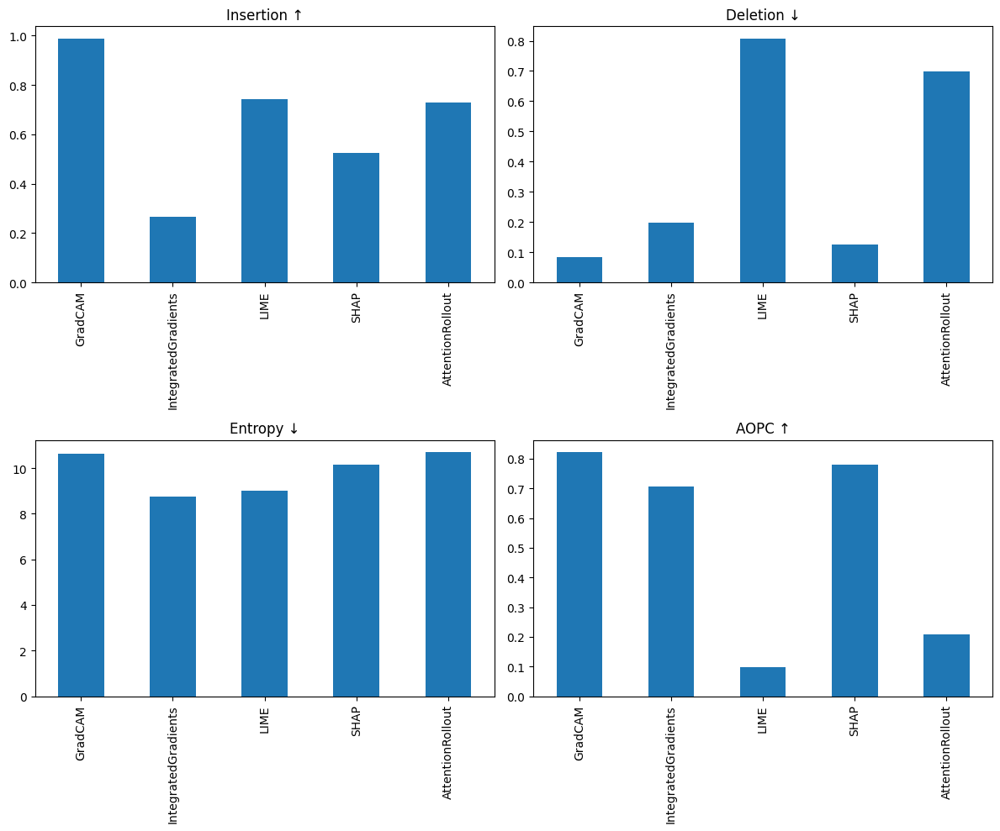

In [72]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(
    2,
    2,
    figsize=(12,10)
)

df["Insertion"].plot.bar(
    ax=ax[0,0],
    title="Insertion ↑"
)

df["Deletion"].plot.bar(
    ax=ax[0,1],
    title="Deletion ↓"
)

df["Entropy"].plot.bar(
    ax=ax[1,0],
    title="Entropy ↓"
)

df["AOPC"].plot.bar(
    ax=ax[1,1],
    title="AOPC ↑"
)

plt.tight_layout()

plt.show()